##**Introduction**

In the dynamic realm of business, the ability to comprehend customer behavior is not merely advantageous; it's imperative. This is where the illumination of web traffic analysis comes into play. Serving as a beacon of knowledge, it establishes the vital link between a business and its clientele, offering profound insights into who they are, what they desire, and how they engage with your business.

Web traffic analysis transcends the boundaries of the marketing department; it's equally indispensable for sales and public relations. Armed with knowledge gleaned from customer behavior, preferences, demographics, and engagement patterns, businesses can strategically tailor their approaches. This encompasses creating resonant content, launching loyalty-inducing campaigns, and developing products that not only meet explicit needs but also address implicit ones. This strategic alignment fuels business success and propels revenue growth.

## **About the dataset**

In a recent technical interview, I delved into a dataset shedding light on real-world business operations. While the data source remains confidential, the dataset provides invaluable insights gleaned from authentic technical interviews. The accompanying screenshot offers a glimpse into this trove of information. To view it in greater detail, simply double-click on the image.

The dataset comprises 71,812 rows and 19 columns, offering a comprehensive view of business interactions. Key elements include visit details, user behavior indicators, and transaction-related metrics. Each data point contributes to a holistic understanding of the customer journey.

## **Analytics Strategy**

As I embark on the analysis, with a focus on sales, marketing, and public relations metrics, Python will be our tool of choice. Before I dive in, it's not just about analysis; it's about the questions we're asking. I've carefully crafted questions for each department, guiding us not just through the data but on a journey to find insights that will shape how we understand sales, marketing, and public relations.

For the ***Sales Department***, I'll delve into crucial facets of customer behavior and sales performance in the Sales Department.

1. How does transaction revenue vary across different device types, revealing our most profitable platforms?
2. Is there a direct correlation between the number of site visits and transactions, offering insights into the customer journey and potential sales barriers?
3. What is the conversion rate between page views and transactions, a vital metric to gauge website and marketing effectiveness?
4. When during the day are users most likely to make a purchase, guiding our sales strategies and optimizing for peak shopping times?

In the **Marketing Department**, our focus will be on key aspects of our digital marketing strategy.

1. Which marketing channels (mediums) are best at attracting visitors, generating page views and revenue?
2. What is the conversion rate for each transaction category based on the number of page views?
3. What devices do visitors use to access the website, shaping our web design for an optimal user experience?

In the **Public Relations Department**, our focus will be on understanding user engagement, the effectiveness of keywords, and the impact of various communication channels.

1. How do page views contribute to the session quality dimension, offering insights into user engagement?
2. Which keywords are most effective across different sources and devices, potentially leading to transactions?
3. How do source-medium combinations impact public perceptions and business success, guiding our public relations strategies?

## **The Art of Analytics**

Before I delve into addressing department-specific questions, let's embark on a journey through the data. To thoroughly examine and understand our dataset, I've employed libraries such as ydataprofiling and create_report for exploratory data analysis (EDA). This crucial step allows us to uncover patterns, identify outliers, and gain an initial understanding of the dataset. You can install and import these libraries using the code snippet below.

## I**nstalling Libraries**

In [ ]:
# Install packages
!pip install pyforest -q
!pip install dataprep -q
!pip install pygal -q
!pip install ydata-profiling -q

## **Importing Libraries**

In [ ]:
import pygal# Import packages
import pyforest
from ydata_profiling import ProfileReport
from dataprep.eda import create_report
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [ ]:
# Read the file
df = pd.read_excel("ga_sessions(2).xlsx")
df.head(5)

<IPython.core.display.Javascript object>

,visitId,visitStartTime,date,visitNumber,visits,hits,pageViews,transactions,newVisits,transactionRevenueInDollars,timeOnScreen,sessionQualityDim,browser,isMobile,operatingSystem,deviceCategory,source,keyword,medium
0,1501326835,2017-07-29 11:13:55,20170729,2,1,301,186.0,NaN,NaN,0,NaN,28.0,Chrome,False,Chrome OS,desktop,(direct),NaN,(none)
1,1500739622,2017-07-22 16:07:02,20170722,2,1,259,175.0,NaN,NaN,0,NaN,88.0,Chrome,False,Macintosh,desktop,(direct),NaN,(none)
2,1498955534,2017-07-02 00:32:14,20170701,3,1,251,168.0,NaN,NaN,0,NaN,NaN,Chrome,False,Chrome OS,desktop,(direct),NaN,(none)
3,1501346674,2017-07-29 16:44:34,20170729,4,1,244,169.0,NaN,NaN,0,NaN,85.0,Chrome,False,Chrome OS,desktop,google,NaN,cpm
4,1500507802,2017-07-19 23:43:22,20170719,1,1,234,117.0,NaN,1.0,0,NaN,53.0,Android Webview,True,Android,mobile,(direct),NaN,(none)


## **Exploratory Data Analysis (EDA)**

In [ ]:
# Create a report to explore data
profile_report= ProfileReport(df, title= "Transaction Traffic Profiling Report")
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Transaction Traffic Report
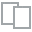
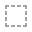
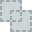
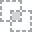
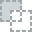
...
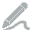
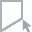
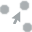
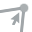
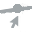

In [ ]:
# Create a report using dataprep
dataprep_report= create_report(df, title= "Transaction Traffic Report")
dataprep_report

Observation:
- Date and visitID is highly correlated (with correlation of 1.0)
- Hits and PageView is highly correlated (with correlation of 0.98)
- Hits and SessionQuality is high correlated to each other (with correlation of 0.70)
- PagesViews and sessionQuality is high correlated to each other (with correlation of 0.72)

In [ ]:
# drop_duplicate
df= df.drop_duplicates()

# Pre-process Nan
df = df.fillna(0)
df

,visitId,visitStartTime,date,visitNumber,visits,hits,pageViews,transactions,newVisits,transactionRevenueInDollars,timeOnScreen,sessionQualityDim,browser,isMobile,operatingSystem,deviceCategory,source,keyword,medium
0,1501326835,2017-07-29 11:13:55,20170729,2,1,301,186.0,0.0,0.0,0,0.0,28.0,Chrome,False,Chrome OS,desktop,(direct),0,(none)
1,1500739622,2017-07-22 16:07:02,20170722,2,1,259,175.0,0.0,0.0,0,0.0,88.0,Chrome,False,Macintosh,desktop,(direct),0,(none)
2,1498955534,2017-07-02 00:32:14,20170701,3,1,251,168.0,0.0,0.0,0,0.0,0.0,Chrome,False,Chrome OS,desktop,(direct),0,(none)
3,1501346674,2017-07-29 16:44:34,20170729,4,1,244,169.0,0.0,0.0,0,0.0,85.0,Chrome,False,Chrome OS,desktop,google,0,cpm
4,1500507802,2017-07-19 23:43:22,20170719,1,1,234,117.0,0.0,1.0,0,0.0,53.0,Android Webview,True,Android,mobile,(direct),0,(none)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71807,1498959336,2017-07-02 01:35:36,20170701,1,1,1,1.0,0.0,1.0,0,0.0,0.0,Safari,True,iOS,mobile,google,(not provided),organic
71808,1498959816,2017-07-02 01:43:36,20170701,1,1,1,1.0,0.0,1.0,0,0.0,0.0,Chrome,True,Android,mobile,google,(not provided),organic
71809,1498931612,2017-07-01 17:53:32,20170701,1,1,1,1.0,0.0,1.0,0,0.0,0.0,Chrome,False,Windows,desktop,google,(not provided),organic
71810,1498928017,2017-07-01 16:53:37,20170701,1,1,1,1.0,0.0,1.0,0,0.0,0.0,Safari,True,iOS,mobile,google,(not provided),organic


While exploring the dateset, I found that only 1.4% of the data, equivalent to 1031 transaction, resulted in a positive outcome.

Now, let's begin answering the questions.

##**Sales Department**

**Question 1: How does transaction revenue vary across different device types, revealing our most profitable platforms?**


Let's understand why analyzing transaction revenue across different device types is crucial for the Sales Department. The distribution of revenue across devices can unveil patterns in customer behavior and guide strategic decisions.

In [ ]:
# Visualise device category to transaction revnue
device_os_revenue= df.pivot_table(index= "deviceCategory", columns= "operatingSystem", values= "transactionRevenueInDollars", aggfunc= "sum")

# Create a pie chart with plotly.express
fig= px.pie(device_os_revenue, values= device_os_revenue.sum(axis= 1), names= device_os_revenue.index, title= "Transaction Revenue by Device Category")
fig.show()

<IPython.core.display.Javascript object>

From the observation, it’s evident that desktops are the primary source of transaction revenue, accounting for 94.5% of the total. Mobile devices contribute 5.06%, while tablets bring up the rear with just 0.397%.

**Question 2: Is there a direct correlation between the number of site visits and transactions, offering insights into the customer journey and potential sales barriers?**

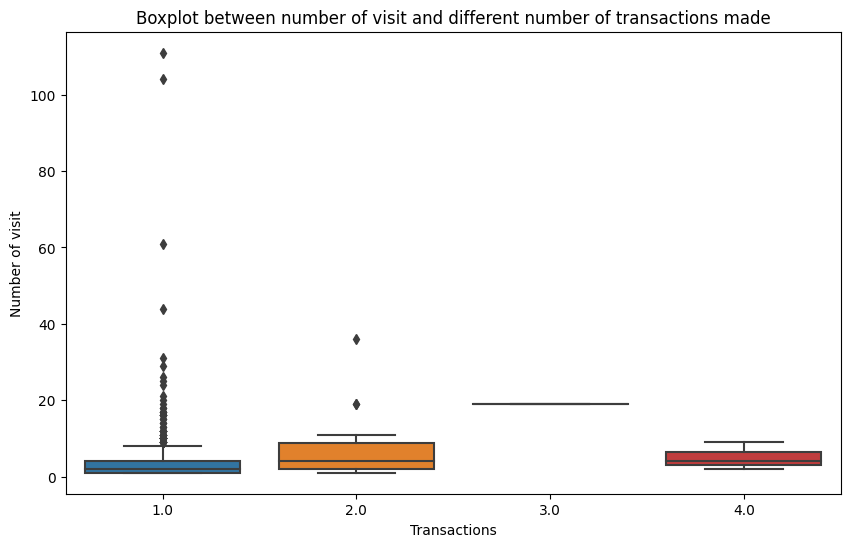

In [ ]:
# Create a boxplots using seaborn
positive_record= df[df['transactions'] != 0]

plt.figure(figsize=(10,6))
boxplot_numvisit_numtrans= sns.boxplot(x= "transactions", y= "visitNumber", data= positive_record)

# Add title and labels
plt.title("Boxplot between number of visit and different number of transactions made")
plt.xlabel("Transactions")
plt.ylabel("Number of visit")
plt.show()

Although a visual representation can convey a wealth of information, it’s crucial to dive more deeper into data to further understand the conversion rate.

The following code allows us to obtain all the data shown in the box plot above including minimum value, maximum value, mean, median, and IQR.

In [ ]:
# Obtain boxplot statistics
boxplot_stats= df.groupby('transactions')['visitNumber'].describe()

# Print the statistics
boxplot_stats

,count,mean,std,min,25%,50%,75%,max
transactions,,,,,,,,
0.0,70696.0,2.165073,8.192442,1.0,1.0,1.0,1.00,395.0
1.0,997.0,3.448345,6.189169,1.0,1.0,2.0,4.00,111.0
2.0,30.0,6.533333,7.314291,1.0,2.0,4.0,8.75,36.0
3.0,1.0,19.000000,NaN,19.0,19.0,19.0,19.00,19.0
4.0,3.0,5.000000,3.605551,2.0,3.0,4.0,6.50,9.0


From the table, it is evident that a significant majority of users, approximately 96.7%, make only one transaction. This highlights the common behavior of single transactions among users in this dataset. The number of users making more than one transaction is relatively small, with around 2.9% making two transactions.

Now, let’s compute the conversion rate where users make one transaction on their first visit.

In [ ]:
# Conversion rate for 1 visit 1 transaction
one_transaction= df[df["transactions"]== 1.0]
two_transaction= df[df["transactions"]== 2.0]
three_transaction= df[df["transactions"]== 3.0]
four_transaction= df[df["transactions"]== 4.0]

one_visit_one_transact= one_transaction[one_transaction["visitNumber"]== 1]
one_visit_one_transact.shape

# Compute the percentage
conversation_rate_one_visit_one_transact= 374/997
conversation_rate_one_visit_one_transact_percentage= conversation_rate_one_visit_one_transact * 100

# Print the result
print(f"The conversion rate where user made 1 transaction on their first visit is {conversation_rate_one_visit_one_transact_percentage}%")

The conversion rate where user made 1 transaction on their first visit is 37.512537612838514%


The calculation surprisingly reveals that 38% of users make a transaction on their first visit to the business medium.

In [ ]:
# Conversion rate for 1 visit 2 transactions
one_visit_two_transact= two_transaction[two_transaction["visitNumber"]== 1]
one_visit_two_transact.shape

# Compute the conversion rate in percentage
conversation_rate_one_visit_two_transact= 5/30
conversation_rate_one_visit_two_transact_percentage= conversation_rate_one_visit_two_transact * 100

# Print the result
print(f"The conversion rate where user made 2 transaction on their first visit is {conversation_rate_one_visit_two_transact_percentage}%")

The conversion rate where user made 2 transaction on their first visit is 16.666666666666664%


Among users who make two transactions, 17% of them make two transactions on their first visit to the business website.

**Question 3: What is the conversion rate between page views and transactions, a vital metric to gauge website and marketing effectiveness?**

In [ ]:
# Calculate the median of page views and transaction revenue in dollars for each transaction category
one_median_pageview_revenue= one_transaction[['pageViews', 'transactionRevenueInDollars']].median()
two_median_pageview_revenue= two_transaction[['pageViews', 'transactionRevenueInDollars']].median()
three_median_pageview_revenue= three_transaction[['pageViews', 'transactionRevenueInDollars']].median()
four_median_pageview_revenue= four_transaction[['pageViews', 'transactionRevenueInDollars']].median()

# Transform into a dataframe
median_pageview_revenue= pd.DataFrame({
    "One Transaction": one_median_pageview_revenue,
    "Two Transactions": two_median_pageview_revenue,
    "Three Transactions": three_median_pageview_revenue,
    "Four Transactions": four_median_pageview_revenue})

# Print the DataFrame
median_pageview_revenue

<IPython.core.display.Javascript object>

,One Transaction,Two Transactions,Three Transactions,Four Transactions
pageViews,22.0,34.5,26.0,51.0
transactionRevenueInDollars,4269.0,6393.0,30380.0,2500.0


The code above extracts page views and transaction revenue for all numbers of transactions and creates a data frame containing median page views and transaction revenue for each number of transactions.

From our observations, it appears that users with a higher number of page views are more likely to make a higher number of transactions, which in turn leads to increased transaction revenue. However, this correlation is only observed among users who have made one or two transactions.

While page views influence the number of transactions, they do not necessarily impact the revenue generated from these transactions. Further insights can be gained by visualizing these trends or performing statistical tests on the observed differences.

**Quetsion 4: When during the day are users most likely to make a purchase, guiding our sales strategies and optimizing for peak shopping times?**

Interestingly, users who make two transactions generate 50% more revenue than those who make just one transaction. Additionally, the page views for users making two transactions are also 50% higher than those making one transaction.

In [ ]:
# Extract visitId, visitStartTime, and transactionRevenueInDollars
datetime_trans= df[["visitId", "visitStartTime", "transactionRevenueInDollars"]]

# Sort the date value
datetime_trans= datetime_trans.sort_values("visitStartTime", ascending= True)

# Print the top 5 rows
datetime_trans.head(5)

# Create an interactive line chart
fig= px.line(datetime_trans,
              x= "visitStartTime",
              y= "transactionRevenueInDollars",
              title= "Visit start time to transaction revenue in dollars")

# Find the peak point
peak= datetime_trans["transactionRevenueInDollars"].idxmax()
peak_time= datetime_trans.loc[peak, "visitStartTime"]
peak_revenue= datetime_trans.loc[peak, "transactionRevenueInDollars"]

# Find the top 5 highest points
top5= datetime_trans.nlargest(5, "transactionRevenueInDollars")
top5_time= top5["visitStartTime"]
top5_revenue= top5["transactionRevenueInDollars"]

# Add another scatter plot to highlight the top 5 points
fig.add_scatter(x= top5_time, y= top5_revenue, mode= "markers", marker= dict(size= 10, color= "green"))

# Show the plot
fig.show()

<IPython.core.display.Javascript object>

The graph above offers an initial understanding of the top five transaction revenues generated by the business during the given period. However, to gain a more comprehensive insight, let’s delve deeper to identify the specific dates and the corresponding transaction revenue amounts.

In [ ]:
# Identify the top 5 date with highest transactionrevenue
top5_trans_visitstarttime= datetime_trans.nlargest(5, "transactionRevenueInDollars")
top5_trans_visitstarttime

,visitId,visitStartTime,transactionRevenueInDollars
732,1500404409,2017-07-18 19:00:09,1058914
180,1499275131,2017-07-05 17:18:51,400956
10,1499951313,2017-07-13 13:08:35,254850
3286,1501533749,2017-07-31 20:42:29,249000
325,1500393728,2017-07-18 16:02:08,240720


This code above allows us to outline the top 5 dates with the highest transaction revenue. The output includes the visit id, visit start time and transaction revenue, providing a clear snapshot of significant revenue-generating instances.

Now, let’s analyse the data from the time of day perspective. The code below breaks down transaction revenue by the time of day.

In [ ]:
# Extracting positive transaction sample
positive_transaction= df[df["transactions"]>= 1.0]

# Create a new column "time_of_day" using visitStartTime
positive_transaction["time_of_day"]= pd.cut(positive_transaction["visitStartTime"].dt.hour,
                                           bins=[0, 6, 12, 18, 24],
                                           labels=["Early Morning", "Morning", "Afternoon", "Evening"],
                                           include_lowest= True)

# Group by 'time_of_day' and calculate the median transaction revenue
time_of_day_revenue= positive_transaction.groupby("time_of_day")["transactionRevenueInDollars"].median()

# Count the number of occurrence in time of day
occurence= positive_transaction['time_of_day'].value_counts()

# Note that we have positive transaction of 1031 records.
total_transrecords = 1031
transaction_rate= {
    "Early Morning": 236/ total_transrecords,
    "Morning": 63/ total_transrecords,
    "Afternoon": 386/ total_transrecords,
    "Evening": 346/ total_transrecords
}

# Create a dataframe
revenue_occurence_transaction= pd.DataFrame({
    "Time of Day": ["Early Morning", "Morning", "Afternoon", "Evening"],
    "Median Revenue": [time_of_day_revenue[label] for label in ["Early Morning", "Morning", "Afternoon", "Evening"]],
    "Occurrence": [occurence[label] for label in ["Early Morning", "Morning", "Afternoon", "Evening"]],
    "Transaction Rate": [transaction_rate[label] for label in ["Early Morning", "Morning", "Afternoon", "Evening"]]
})

# Sort the dataframe by occurrence
revenue_occurence_transaction= revenue_occurence_transaction.sort_values(by="Occurrence", ascending=False)
revenue_occurence_transaction

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Time of Day,Median Revenue,Occurrence,Transaction Rate
2,Afternoon,5023.0,386,0.374394
3,Evening,3992.5,346,0.335597
0,Early Morning,4087.5,236,0.228904
1,Morning,3200.0,63,0.061106


From the analysis, I found that the business generates more revenue in the afternoon as compared to other times in the day.

With our analysis, I discovered that the likelihood of transactions occurring is evenly distributed throughout the day (if I combine both early morning and morning).

Worth mentioning that the computation of transaction rates for each time period suggests that the business has a compelling 37.44% opportunity to generate revenue during the afternoon hours.

## **Marketing Department**

**Queston 1: Which marketing channel (medium) is the most successful in attracting visitors to the website, generating page views and generating revenue?**

In [ ]:
# Medium to number of visits
medium_num_visit= positive_transaction.groupby("medium").agg({"visitNumber": ["median", "mean"]})
medium_num_visit.columns= ['_'.join(col) for col in medium_num_visit.columns.values]
medium_num_visit= medium_num_visit.sort_values(["visitNumber_median", "visitNumber_mean"], ascending= [False, False])

# Medium to page views
medium_pageview= positive_transaction.groupby("medium").agg({"pageViews": ["median", "mean"]})
medium_pageview.columns= ['_'.join(col) for col in medium_pageview.columns.values]
medium_pageview= medium_pageview.sort_values(["pageViews_median", "pageViews_mean"], ascending= [False, False])

# Medium to transaction revenue
medium_revenue= positive_transaction.groupby("medium").agg({"transactionRevenueInDollars": ["median", "mean"]})
medium_revenue.columns= ['_'.join(col) for col in medium_revenue.columns.values]
medium_revenue= medium_revenue.sort_values(["transactionRevenueInDollars_median", "transactionRevenueInDollars_mean"], ascending= [False, False])

# Combine the two dataframes
medium_visit_pageview_revenue= pd.concat([medium_num_visit, medium_pageview, medium_revenue], axis=1)
medium_visit_pageview_revenue.head(6)

<IPython.core.display.Javascript object>

,visitNumber_median,visitNumber_mean,pageViews_median,pageViews_mean,transactionRevenueInDollars_median,transactionRevenueInDollars_mean
medium,,,,,,
cpm,2.0,8.526316,19.0,23.000000,3749.0,8447.000000
organic,2.0,3.567568,23.0,26.564189,3772.5,8422.199324
(none),2.0,3.508423,22.0,25.473201,4479.0,14292.638591
referral,2.0,3.285714,25.0,30.785714,4632.5,5230.714286
cpc,2.0,2.355556,24.0,27.688889,3879.0,7586.000000
affiliate,2.0,1.750000,25.5,28.000000,12393.0,12192.750000


For every marketing strategy, understanding the target audience’s behavior is crucial. This code analyzes the effectiveness of different marketing channels in terms of attracting visitors to the website and engaging them with content. It provides insights into the average and typical number of visits and page views each marketing channel generates. It also provide the insight regarding the revenue generation.

<IPython.core.display.Javascript object>

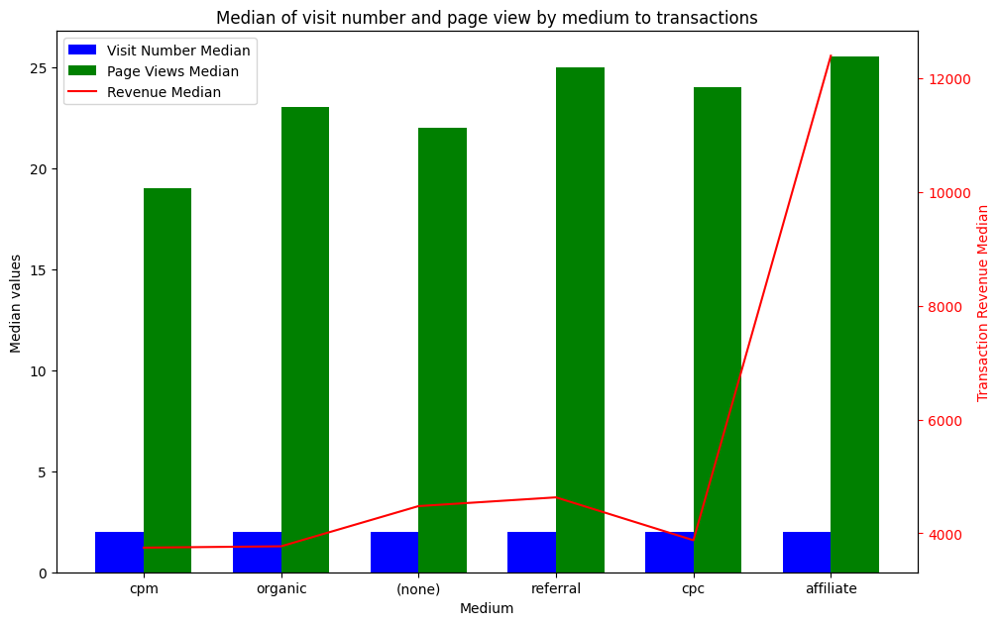

In [ ]:
# which medium is generating most revenue?
# Create a figure and a set of subplots
fig, ax1= plt.subplots(figsize= (10, 6))

# Create an array for the positions of the bars on the x-axis
ind= np.arange(len(medium_visit_pageview_revenue.index))

# Width of the bars
width= 0.35

# Create bar plots for 'visitNumber_median' and 'pageViews_median'
p1= ax1.bar(ind - width/2, medium_visit_pageview_revenue["visitNumber_median"], width, color= "b", label= "Visit Number Median")
p2= ax1.bar(ind + width/2, medium_visit_pageview_revenue["pageViews_median"], width, color= "g", label= "Page Views Median")

# Create a second y-axis for the same x-axis
ax2= ax1.twinx()

# Create a line plot for revenue
p3= ax2.plot(ind, medium_visit_pageview_revenue["transactionRevenueInDollars_median"], color= "r", label= "Revenue Median")
ax2.set_ylabel("Transaction Revenue Median", color= "r")
ax2.tick_params("y", colors= "r")

# Add a legend for the line plot
fig.tight_layout()
# Adjust the position of the legend box
fig.legend(loc= "upper left", bbox_to_anchor=(0,1), bbox_transform= ax1.transAxes)

ax1.set_xlabel("Medium")
ax1.set_ylabel("Median values")
ax1.set_title("Median of visit number and page view by medium to transactions")
ax1.set_xticks(ind)
ax1.set_xticklabels(medium_visit_pageview_revenue.index)

plt.show()

From the output above, I see that all mediums have the same median visit number of 2, suggesting that users have engaged with the business website at least twice. On the other hand, the mean visit number shows variations across different marketing channels. Notably, the 'cpm' (cost per thousand impressions) medimum has the highest average visit number at 8.53. This suggests that, on average, users coming from the 'cpm' medium tend to visit the website more frequently compared to other channels. On the other hand, the 'affiliate' medium has the lowest mean visit number at 1.75, indicating lower average engagement from users in this channel.

Conversely, "affiliate," despite having the lowest average number of visits, emerges as a strong performer in terms of median page views. This indicates that users from the "affiliate" medium exhibit a tendency to explore more pages during their visits, indicating a higher level of engagement despite the lower overall visit count. Not to mention that affiliates bring the highest median revenue to the business. This indicates that affiliate medium is a quality channel for the business in terms of generating revenue. It generates a median revenue of $12,393 with 4 transactions.

The comparison with the table related to the number of visits highlights an intriguing contrast. While "cpm" excels in driving traffic with the highest average number of visits, it falls behind in both average and median page views. This suggests that the effectiveness of "cpm" in driving traffic may not translate into deeper engagement with the website content.

**Question 2: What is the conversion rate for each transaction category based on the number of page views?**

The code below allows us to calculate the conversion rate for each transaction category, by dividing the median transaction revenue by the median number of page views. The analysis above allows us to compute the median transaction revenue to the median value of page views for each number of transactions made. This is particularly useful as it helps us understand the relationship between the number of transactions and the corresponding revenue generated, offering a measure of the effectiveness of the page views.

In [ ]:
# Calculate the conversion rate for each transaction category
one_conversion_rate = one_transaction['transactionRevenueInDollars'].median()/ one_transaction['pageViews'].median()
two_conversion_rate = two_transaction['transactionRevenueInDollars'].median()/ two_transaction['pageViews'].median()
three_conversion_rate = three_transaction['transactionRevenueInDollars'].median()/ three_transaction['pageViews'].median()
four_conversion_rate = four_transaction['transactionRevenueInDollars'].median()/ four_transaction['pageViews'].median()

# Calculate the median page views for each transaction category
one_pageview_median = one_transaction['pageViews'].median()
two_pageview_median = two_transaction['pageViews'].median()
three_pageview_median = three_transaction['pageViews'].median()
four_pageview_median = four_transaction['pageViews'].median()

# Create a dataframe
pageview_revenue_conversion_rate= pd.DataFrame({"One Transaction": [one_conversion_rate, one_pageview_median],
                                                "Two Transactions": [two_conversion_rate, two_pageview_median],
                                                "Three Transactions": [three_conversion_rate, three_pageview_median],
                                                "Four Transactions": [four_conversion_rate, four_pageview_median]},
                                                index=['Conversion Rate', 'Median Page Views'])
pageview_revenue_conversion_rate

<IPython.core.display.Javascript object>

,One Transaction,Two Transactions,Three Transactions,Four Transactions
Conversion Rate,194.045455,185.304348,1168.461538,49.019608
Median Page Views,22.000000,34.500000,26.000000,51.000000


The output above compares the efficiency revenue generation per page view, for each transaction category. This allows us to identify which transaction category is most effective in terms of conversion rate.

The table reveals that one transaction record has the best conversion rate among others. That is for every median of 22 views from individuals who make a single transaction, the business is projected to generate a median revenue of 194.05. In a similar vein, with a median of 34.5 views from those who carry out 2 transactions, the anticipated median revenue is 185.30. For those who make 3 transactions with a median of 26 views, the median revenue dramatically increases to 1168.46. However, for those making 4 transactions with a median of 51 views, the median revenue decreases to $49.02.

Although the three transactions have the highest transaction conversion rate, however, given the significant data imbalance across the number of transactions (that is 997 for one transaction, 30 for two transactions, 1 for three transactions and 3 for four transactions), it’s important to note that the high conversion rate for three transactions might not be statistically significant due to the small sample size.

Therefore, while it appears to be the most effective in terms of conversion rate, this does not mean the finding is statistically significant. Indeed, further data collection and analysis would be needed to confirm this trend to better interpret data for business use.

**Question 3: What devices do visitors use to access the website, shaping our web design for an optimal user experience?**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

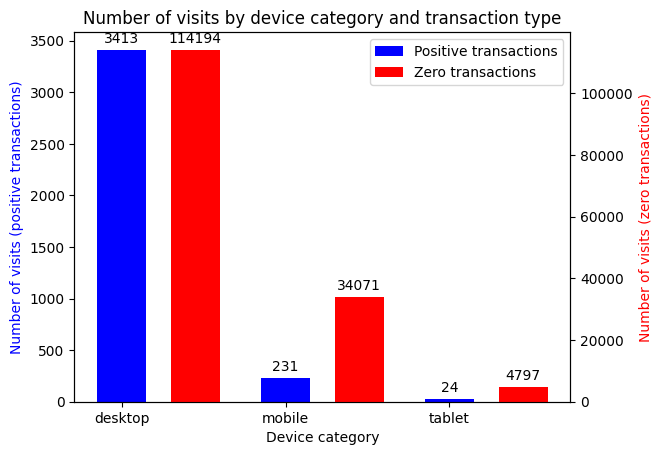

In [ ]:
# Assuming 'df' is your original DataFrame and 'Transactions' is the column with the number of transactions
positive_transactions_df= df[df["transactions"]>= 1]
negative_transactions_df= df[df["transactions"]== 0]

# Calculate the sum of visits for each device category
positive_category= positive_transactions_df.groupby("deviceCategory")["visitNumber"].sum()
negative_category= negative_transactions_df.groupby("deviceCategory")["visitNumber"].sum()

# Create the bar plot
fig, ax1= plt.subplots()

# Set the bar width
bar_width= 0.3

# Set the positions of the bars
positive_bar_positions= np.arange(len(positive_category))
negative_bar_positions= positive_bar_positions + bar_width

# Create the bars for positive transactions
bar1= ax1.bar(positive_bar_positions, positive_category, width=bar_width, color= "b", align= "center")

# Create a twin Axes sharing the x-axis
ax2= ax1.twinx()

# Create the bars for zero transactions
bar2 = ax2.bar(negative_bar_positions, negative_category, width=bar_width, color= "r", align= "edge")

# Set the x-axis tick labels
ax1.set_xticks(positive_bar_positions)
ax1.set_xticklabels(positive_category.index)

# Add labels and title
ax1.set_xlabel("Device category")
ax1.set_ylabel("Number of visits (positive transactions)", color= "b")
ax2.set_ylabel("Number of visits (zero transactions)", color= "r")
plt.title("Number of visits by device category and transaction type")

# Add data labels
ax1.bar_label(bar1, padding=3)
ax2.bar_label(bar2, padding=3)

# Add a single legend for both positive and zero transactions
ax1.legend([bar1, bar2], ["Positive transactions", "Zero transactions"], loc= "upper right")

# Show the plot
plt.show()

In the chart above, I adopt a dual-axis approach for presentation. The y-axis on the left corresponds to the number of visits resulting in positive transactions, while the y-axis on the right represents the number of visits for zero transaction samples. This approach allows us to compare both positive and negative transaction samples on the same charts to see the differences between the two data samples.

It is interesting to see that the desktop is the most common device users use to visit the business website. Notably, the number of visits resulting in zero transactions is significantly higher than those resulting in positive transactions across all device categories. This implies a requirement to enhance user experience, optimize UX, and identify the genuine needs of customers to stimulate increased positive transactions for the business.

## **Public Relations Department**

**Question 1: How do page views contribute to the session quality dimension, offering insights into user engagement? **

In [ ]:
# Visualise medium to-page view to session quality dimension
positive_medium_pageview_quality= positive_transactions_df.groupby("medium")[["pageViews", "sessionQualityDim"]].median()
positive_medium_pageview_quality= positive_medium_pageview_quality.sort_values(by= "pageViews", ascending= False)

negative_medium_pageview_quality = negative_transactions_df.groupby("medium")[["pageViews", "sessionQualityDim"]].median()
negative_transactions_df= negative_transactions_df.sort_values(by= "pageViews", ascending= False)

all_medium_pageview_quality= pd.concat([positive_medium_pageview_quality, negative_medium_pageview_quality], keys=["Positive", "Negative"])
all_medium_pageview_quality

<IPython.core.display.Javascript object>

pageViews  sessionQualityDim
         medium                                 
Positive affiliate       25.5               48.0
         referral        25.0               84.0
         cpc             24.0               45.0
         organic         23.0               54.0
         (none)          22.0               75.0
         cpm             19.0               54.0
Negative (none)           2.0                1.0
         (not set)        1.0                1.0
         affiliate        1.0                1.0
         cpc              3.0                1.0
         cpm              2.0                1.0
         organic          1.0                1.0
         referral         1.0                1.0

The provided Python code aims to analyze and compare positive and negative transaction samples based on the medium used, with the median of page view and session quality computed.

From the output above, the affiliate medium has the highest median page views among positive transactions but with a lower session quality dimension. This suggests that while affiliate marketing attracts visitors, their engagement quality might be relatively lower.

**Question 2: Which keywords are most effective across different sources and devices, potentially leading to transactions?**

In [ ]:
# Keyword to transactions
positive_keywords_transactions= positive_transactions_df[["keyword", "transactions"]]
negative_keywords_notransactions= negative_transactions_df[["keyword", "transactions"]]

positive_keywords= positive_keywords_transactions["keyword"].value_counts()
negative_keywords= negative_keywords_notransactions["keyword"].value_counts()

positive_keywords= positive_keywords.rename_axis("keywords").reset_index(name= "positive_sample")
negative_keywords= negative_keywords.rename_axis("keywords").reset_index(name= "negative_sample")

# Merge the two dataframes on keywords
keywords_combined= pd.merge(positive_keywords, negative_keywords, on= "keywords")

# Get the top 5 rows
top5_keywords= keywords_combined.head(5)
top5_keywords

<IPython.core.display.Javascript object>

,keywords,positive_sample,negative_sample
0,0,693,33098
1,(not provided),295,34815
2,6qEhsCssdK0z36ri,34,893
3,1hZbAqLCbjwfgOH7,5,331
4,google merchandise store,2,136


The code above analyses the keywords that users employ in their search queries to reach the business website for both positive and negative transactions, with the output displaying the top 5 keywords count.

The code above analyses the keywords that users employ in their search queries to reach the business website for both positive and negative transactions, with the output displaying the top 5 keywords count

**Question 3: How do source-medium combinations impact public perceptions and business success, guiding our public relations strategies?**

In [ ]:
source_medium_trans_pivot= positive_transactions_df.pivot_table(index= "source", columns= "medium", values= "transactions", aggfunc= np.sum, fill_value= 0)
source_medium_trans_pivot

<IPython.core.display.Javascript object>

medium,(none),affiliate,cpc,cpm,organic,referral
source,,,,,,
(direct),684,0,0,0,0,0
Partners,0,4,0,0,0,0
bing,0,0,0,0,2,0
calendar.google.com,0,0,0,0,0,1
dfa,0,0,0,5,0,0
google,0,0,48,16,296,0
m.facebook.com,0,0,0,0,0,1
mail.google.com,0,0,0,0,0,3
outlook.live.com,0,0,0,0,0,1


The code above analyses the keywords that users employ in their search queries to reach the business website for both positive and negative transactions, with the output displaying the top 5 keywords count

Out of the 1031 records for positive transactions, I observe a total of 1072 transactions which indicates some records have more than 1 transaction.

The pivot table reveals that two-thirds of transactions are from direct sources/ traffic. This suggests that a significant portion of visitors are accessing the business website directly, likely by entering the business URL into their browser or clicking on a bookmarked link.

Conversely, about one-third of transactions are attributed to the Google organic source medium. This implies that these visitors are finding the business website through a search engine (in our case, it is Google), specifically by clicking on non-paid search results.

Worth mentioning that, approximately 6% of the total transactions came from both the cpc and cpm. This indicates that a portion of users made a transaction by interacting with ads and viewing the ads.

## **Adopting 5 WHYs Approach in Our Case**

The 5 Whys approach, often known as a root cause analysis tool, is powerful for problem-solving. The 5 why approach is originating from Sakichi Toyoda’s innovative practices for Toyota’s manufacturing processes. This method involves asking “Why?” five times in succession. Each subsequent question allows us to dive deeper into the issue to uncover the underlying causes of an event and eliminate the problem at its source.

The approach itself is not just a methodology, but a journey towards continuous improvement. It is a flexible strategy tailored to the problem at hand. It’s not all about the number (quantity), but the depth of inquiry (quality). While the name suggests five, the actual count can be more or less to uncover actionable insights. Without further ado, let’s apply the 5 whys methodology in our case.

In our case, I define a total of 12 questions to delve into the intricacies of our operations and uncover opportunities for improvement.

**Sales Department**

1. Why is the majority of transactions concentrated on the desktop, and why haven't comprehensive measures been explored to optimize profitability across diverse platforms?
2. Why are there potential barriers in the customer journey not reflected in transactions, and why hasn't there been an initiative to thoroughly review and understand customer personas for better alignment with their needs?
3. Why is there a low conversion rate between page views and transactions, and why haven't strategies been implemented to address these barriers and potentially boost sales?
4. Why hasn't the business successfully converted visits and page views into transactions, and why do customers hesitate to complete transactions?
5. Why haven't personalized marketing strategies been implemented to address individual customer needs and preferences, fostering a stronger connection and encouraging transactions?

**Marketing Department**

1. Why does the 'cpm' medium attract more visits than expected given its lower page views, and why does the 'affiliate' medium, with fewer initial visits, encourage more user confidence and higher page views?
2. Why are users less likely to make transactions on mobile and tablet devices, and why might the user experience during the search process be less optimal on these devices?
3. Why hasn't the marketing team conducted A/B testing on different ad creatives and strategies to identify and optimize the most effective approaches for attracting users and driving conversions?
4. Why hasn't the marketing team delved into a comprehensive analysis of the negative sample, examining user behavior and identifying pain points, to transform challenges into opportunities for improvement?

**Public Relations Departments**

1. Why, despite high page views, does the affiliate medium have lower session quality and only 4 transactions? Also, why hasn't the session quality of the affiliate medium been analyzed, and how can we improve the overall user experience?
2. Why do "none" medium and organic generate the highest revenue despite lower page views and session quality?
3. Why is the keyword not captured in the majority of records, and why haven't keyword searches been analyzed? Why haven't SEO and SEM strategies been optimized based on keyword performance in directing traffic to the website?

## **Recommendations**

While defining the 12 why statements is a straightforward task, choosing which statement to prioritize poses a significant challenge.

Therefore, I have evaluated and identified three 'why' statements to prioritize. This decision is based on considerations of business impact, urgency, feasibility, and a customer-centric approach.

For the **sales department**, I have chosen the why statement, focusing on addressing a fundamental challenge in transforming user interactions into successful transactions and directly impacting revenue.

Why Statement: Why are there potential barriers in the customer journey not reflected in transactions, and why hasn't there been an initiative to thoroughly review and understand customer personas for better alignment with their needs?

For **marketing department**, the selected why statement centers on addressing the different aspects that will influence user experience, engagement and conversion.

Why statement: Why hasn't the marketing team conducted A/B testing on different ad creatives and strategies to identify and optimize the most effective approaches for attracting users and driving conversions?

For **public relations department**, the focus is on improving online visibility and traffic strategies.

Why statement: Why is the keyword not captured in the majority of records, and why haven't keyword searches been analyzed? Why haven't SEO and SEM strategies been optimized based on keyword performance in directing traffic to the website?

## **Summary**

In conclusion, the application of the 5 Whys approach has provided a structured and insightful framework for uncovering the root causes of operational challenges within our Sales, Marketing, and Public Relations departments. By systematically questioning underlying issues, I have identified key priorities that align with our commitment to continuous improvement. The focus on understanding customer personas in the Sales department, conducting A/B testing in the Marketing department, and optimizing keyword strategies in the Public Relations department reflects a strategic approach to enhancing user experiences, driving conversions, and improving online visibility. As I embark on implementing solutions derived from these priority areas, I anticipate not only addressing specific challenges but also fostering a culture of adaptability and innovation within the organization. The 5 Whys approach serves not only as a problem-solving tool but also as a catalyst for ongoing excellence and growth.